In [392]:
import pandas as pd
import numpy as np
import os
from sklearn.preprocessing import StandardScaler,RobustScaler
from sklearn import metrics
import matplotlib.pyplot as plt
from scipy import signal
import glob
import antropy
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
from scipy.signal import butter, sosfilt, sosfreqz, detrend,stft
import math
from scipy.signal import stft,find_peaks
from scipy.stats import kurtosis,skew
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler,StandardScaler
import pywt
import plotly.express as px

### Feature Extraction from segmented Prox and IMU timeseries

In [393]:
### Read the detrended data
sensor_ts_df_original = pd.read_parquet(r".\sensor_ts_df_offset.parquet")

In [394]:
sensor_list = ['IMU_1_x','IMU_1_y','IMU_1_z','Prox','IMU_2_x','IMU_2_y','IMU_2_z']

In [395]:
scaled_lst = []
for i in sensor_ts_df_original['File'].unique(): ## Scale for each session
    sensor_series = sensor_ts_df_original.loc[sensor_ts_df_original['File'] == i]
    robust_scale = RobustScaler()
    robust_scale.fit(sensor_series[sensor_list])
    scaled_series = robust_scale.transform(sensor_series[sensor_list])
    scaled_lst.append(pd.DataFrame(scaled_series))
scaled_sensor_ts_df = pd.concat(scaled_lst,axis = 0)

In [396]:
scaled_sensor_ts_df.columns = sensor_list

In [397]:
sensor_ts_df_demed = pd.concat([sensor_ts_df_original[['data_pt','label','label_chewing','label_eating','File']],scaled_sensor_ts_df.reset_index(drop = True)],axis = 1)

In [398]:
def count_zero_crossings(arr):
    return ((arr[:-1].to_numpy() * arr[1:].to_numpy()) < 0).sum()

def find_ten_largest_fft(fft):
    fft_abs = np.abs(fft)
    one_sided_fft = 2*fft_abs[0:int(len(fft)/2.)]/(len(fft)/2)
    new_X = np.linspace(0, int(60/2), int((len(fft)/2)), endpoint=True)
    sorted_idx = np.argsort(one_sided_fft)
    ten_largest_freq = new_X[sorted_idx][-10:]
    ten_largest_freq_magnitude = one_sided_fft[sorted_idx][-10:]
    return ten_largest_freq,ten_largest_freq_magnitude

def find_freq_energy(signal,lower,upper):
    fft_abs = np.abs(signal)
    one_sided_fft = 2*fft_abs[0:int(len(fft_abs)/2.)]/(len(fft_abs)/2)
    freq_energy = (one_sided_fft[int(lower/0.5):int(upper/0.5)+1]**2).sum()
    return freq_energy

def get_spec_energy(fft):
    return np.sum(np.real(fft)*np.real(fft) + np.imag(fft)*np.imag(fft))

def filtering(signal,lowcut,highcut,fs):
    
    def butter_bandpass(lowcut, highcut, fs, order=5):
        nyquist = 0.5 * fs
        low = lowcut / nyquist
        high = highcut / nyquist
        sos = butter(order, [low, high], btype='band', output='sos')
        return sos

    sos = butter_bandpass(lowcut, highcut, fs)

    filtered_data = sosfilt(sos, signal)
    return filtered_data

def plot_fft(signal,ax):
    signal = signal - signal.mean()
    FFT =np.fft.fft(signal)
    new_N=int(len(FFT)/2) 
    f_nat=60
    new_X = np.linspace(10**-12, f_nat/2, new_N, endpoint=True)
    FFT_abs=np.abs(FFT)
    ax.plot(new_X,2*FFT_abs[0:int(len(FFT)/2.)]/len(new_X),color='black')

In [399]:
## Extract 2s window segments for a sensor
def extract_frames(sensor_ts_df,sensor):
    window_size = 120
    window_step = 60
    start = 0
    end = len(sensor_ts_df) - 1
    ts_lst = []
    for win_start in range(start,end,window_step):
        win_end = win_start + window_size
        if win_end >= end:
            break
        frame = sensor_ts_df.iloc[win_start:win_end]
        if np.any(np.abs(frame['Prox'].diff()) > 100): ## discard the window if it contains diff above the threshold
            continue
        Prox_frame = frame[sensor].to_frame().T
        Prox_frame.columns = [i for i in range(120)]
        if frame.iloc[-1]['data_pt'] < frame.iloc[0]['data_pt']:
            continue
        if frame['label_eating'].mean() > 0.5:
            Prox_frame['label_eating'] = 1
            Prox_frame['label_chewing_count'] = frame['label_chewing'].sum()
        else:
            Prox_frame['label_eating'] = 0
            Prox_frame['label_chewing_count'] = 0
        Prox_frame['win_start'] = win_start
        Prox_frame['win_end'] = win_end
        ts_lst.append(Prox_frame)
    ts_df = pd.concat(ts_lst,axis = 0).reset_index(drop = True)
    return ts_df

In [400]:
Prox_demed = extract_frames(sensor_ts_df_demed,'Prox')

In [401]:
## Visualize 2s window segments, compare between 1 and 0 cases in terms of psd, fft, peaks, etc.
def visualize(ts_df,prom_threshold):
    fig,ax = plt.subplots(2,6,figsize = (20,10))
    eating = ts_df.loc[ts_df['label_eating'] == 1].sample(n=3)
    non_eating = ts_df.loc[ts_df['label_eating'] == 0].sample(n=3)
    for i in range(6):
        if i < 3:
            eating_signal = eating.iloc[i][[x for x in range(120)]]
            count = eating.iloc[i]['label_chewing_count']
            #f_psd, Pxx_dens = signal.periodogram(eating_signal, fs = 60)
            #f,t,Zxx = stft(filtering(eating.iloc[i][[x for x in range(120)]],0.1,3,60),120,nperseg = 20,scaling = 'psd')
            peaks = find_peaks(eating_signal,prominence= prom_threshold)
            ax[0,i].plot([x for x in range(120)],eating.iloc[i][[x for x in range(120)]])
            [ax[0,i].axvline(p, c='C3', linewidth=0.3) for p in peaks[0]]
            cwtmatr, freqs = pywt.cwt(eating_signal, np.arange(1, 41), 'mexh')
            ax[0,i+3].imshow(cwtmatr, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max())
            #plot_fft(eating.iloc[i],ax[0,i+3])
            #Pxx_dens_dB = 10*np.log10(Pxx_dens/Pxx_dens.max())
            #ax[0,i+3].plot(f_psd,Pxx_dens_dB)
            ##ax[0,i+3].plot(f,(np.abs(Zxx)**4).mean(axis = 1) / ((np.abs(Zxx)**2).mean(axis = 1))**2 - 2)
            ##ax[0,i+3].plot(f,Pxx_dens)
            print(count)
        else:
            non_eating_signal = non_eating.iloc[i-3][[x for x in range(120)]]
            #f_psd, Pxx_dens = signal.periodogram(non_eating.iloc[i-3][[x for x in range(120)]], fs = 60)
            ##f,t,Zxx = stft(filtering(non_eating.iloc[i-3][[x for x in range(120)]],0.1,3,60),120,nperseg = 20,scaling = 'psd')
            ax[1,(i-3)].plot([x for x in range(120)],non_eating.iloc[i-3][[x for x in range(120)]])
            peaks = find_peaks(non_eating_signal,prominence=prom_threshold)
            [ax[1,(i-3)].axvline(p, c='C3', linewidth=0.3) for p in peaks[0]]
            cwtmatr, freqs = pywt.cwt(non_eating_signal, np.arange(1, 41), 'mexh')
            ax[1,i].imshow(cwtmatr, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max())
            #plot_fft(non_eating.iloc[i-3],ax[1,i])
            #Pxx_dens_dB = 10*np.log10(Pxx_dens/Pxx_dens.max())
            #ax[1,i].plot(f_psd,Pxx_dens_dB)
            ##ax[1,i].plot(f,(np.abs(Zxx)**4).mean(axis = 1) / ((np.abs(Zxx)**2).mean(axis = 1))**2 - 2)
            ##ax[1,i].plot(f,Pxx_dens)
    plt.show()

6.0
4.0
4.0


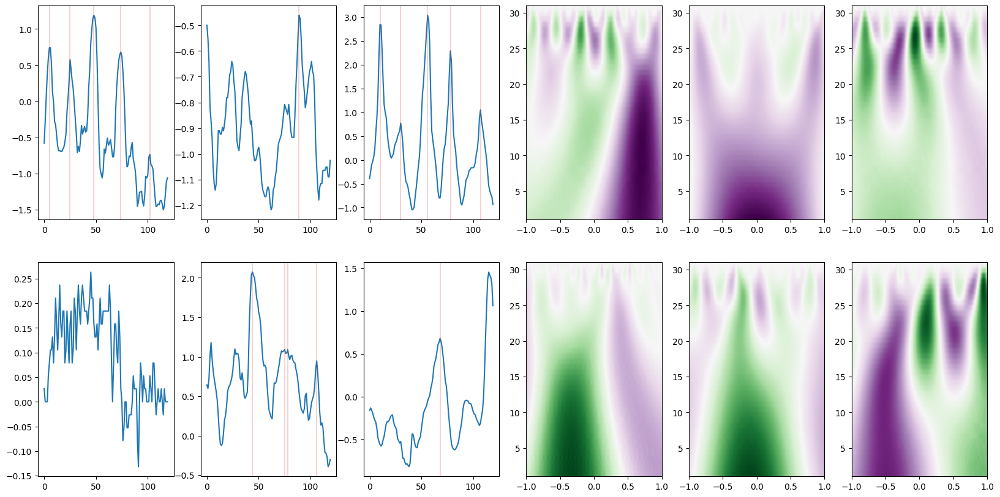

In [402]:
visualize(Prox_demed,0.7)

In [403]:
feature_set = {'MAV':[],'min_t':[],'max_t':[],'range':[],'rms':[],'median':[],'variance':[],'std':[],'skewness':[],'kurtosis':[],'IQR':[],'mean_freq':[],'median_freq':[],'min_PSD':[],'max_PSD':[],'mean_PSD':[],'std_PSD':[],'median_PSD':[],'skewness_PSD':[],'kurtosis_PSD':[],'spectral_kurtosis':[],'spectral_entropy':[],'kurtosis_STFT':[],'skewness_STFT':[],'freq_band_q1':[],'freq_band_q2':[],'freq_band_q3':[],'freq_band_q4':[],'num_peaks':[],'zero_crossings':[]}
label_chewing_detection = []
label_chewing_count = []
window_size = 120
window_step = 60
start = 0
end = len(sensor_ts_df_demed) - 1
for win_start in range(start,end,window_step):
    win_end = win_start + window_size
    if win_end >= end:
        break
    frame = sensor_ts_df_demed.iloc[win_start:win_end]
    if frame.iloc[-1]['data_pt'] < frame.iloc[0]['data_pt']:
        continue
    Prox_demean = frame['Prox']
    if np.any(np.abs(Prox_demean.diff()) > 4): ## discard the window if it contains diff above the threshold
        continue
    Prox_demean = frame['Prox'] - frame['Prox'].mean()
    feature_set['MAV'].append(Prox_demean.abs().mean())
    feature_set['min_t'].append(Prox_demean.min())
    feature_set['max_t'].append(Prox_demean.max())
    feature_set['range'].append(Prox_demean.max()-Prox_demean.min())
    feature_set['rms'].append(math.sqrt((Prox_demean**2).sum()))
    feature_set['median'].append(Prox_demean.quantile(0.5))
    feature_set['variance'].append((Prox_demean.std())**2)
    feature_set['std'].append(Prox_demean.std())
    feature_set['skewness'].append(Prox_demean.skew())
    feature_set['kurtosis'].append(kurtosis(Prox_demean))
    feature_set['IQR'].append(Prox_demean.quantile(0.75)-Prox_demean.quantile(0.25))
    f, Pxx_dens = signal.periodogram(Prox_demean,fs = 60,window = 'hann')
    feature_set['mean_freq'].append((f*Pxx_dens).sum()/Pxx_dens.sum())
    feature_set['median_freq'].append(Pxx_dens.sum()/2)
    f_stft,t_stft,Zxx = stft(Prox_demean,fs = 60,nperseg = 30,scaling = 'psd')
    feature_set['min_PSD'].append(Pxx_dens.min())
    feature_set['max_PSD'].append(Pxx_dens.max())
    feature_set['mean_PSD'].append(Pxx_dens.mean())
    feature_set['std_PSD'].append(Pxx_dens.std())
    feature_set['median_PSD'].append(np.quantile(Pxx_dens,0.5))
    feature_set['skewness_PSD'].append(skew(Pxx_dens))
    feature_set['kurtosis_PSD'].append(kurtosis(Pxx_dens))
    feature_set['spectral_kurtosis'].append(((np.abs(Zxx)**4).mean(axis = 1) / ((np.abs(Zxx)**2).mean(axis = 1))**2 - 2).mean())
    feature_set['spectral_entropy'].append(antropy.spectral_entropy(Prox_demean, sf=60, method='welch', normalize=True))
    feature_set['kurtosis_STFT'].append(kurtosis(np.abs(Zxx),axis = None))
    feature_set['skewness_STFT'].append(skew(np.abs(Zxx),axis = None))
    for i in np.arange(0.5,5.5,0.5).tolist():
        if f'Freq_{i}' in feature_set.keys():
            feature_set[f'Freq_{i}'].append(Pxx_dens[int(i/0.5)])
        else:
            feature_set[f'Freq_{i}'] = [Pxx_dens[int(i/0.5)]]
    FFT = np.fft.fft(Prox_demean)
    ten_largest_fft_idx,ten_largest_fft_mag = find_ten_largest_fft(FFT)
    for i in range(10):
        if (f'Freq_{i}_idx' in feature_set.keys()) and (f'Freq_{i}_mag' in feature_set.keys()):
            feature_set[f'Freq_{i}_idx'].append(ten_largest_fft_idx[i])
            feature_set[f'Freq_{i}_mag'].append(ten_largest_fft_mag[i])
        else:
            feature_set[f'Freq_{i}_idx'] = [ten_largest_fft_idx[i]]
            feature_set[f'Freq_{i}_mag'] = [ten_largest_fft_mag[i]]
    total_energy = get_spec_energy(FFT)
    feature_set['freq_band_q1'].append(find_freq_energy(FFT,0.5,2.5)/total_energy)
    feature_set['freq_band_q2'].append(find_freq_energy(FFT,3.0,5.0)/total_energy)
    feature_set['freq_band_q3'].append(find_freq_energy(FFT,5.5,17.5)/total_energy)
    feature_set['freq_band_q4'].append(find_freq_energy(FFT,18,30.0)/total_energy)
    feature_set['num_peaks'].append(len(find_peaks(Prox_demean,prominence = 0.7)[0]))
    if frame['label_eating'].mean() > 0.5:
        label_chewing_detection.append(1)
        label_chewing_count.append(frame['label_chewing'].sum())
    else:
        label_chewing_detection.append(0)
        label_chewing_count.append(0)
    feature_set['zero_crossings'].append(count_zero_crossings(Prox_demean))
chewing_detection_label = pd.DataFrame(label_chewing_detection).rename(columns = {0:'chewing_detection'})
chewing_count_label = pd.DataFrame(label_chewing_count).rename(columns = {0:'chewing_count'})
features = pd.DataFrame.from_dict(feature_set)
features.columns = [f'Prox_{i}' for i in list(feature_set.keys())]
Prox_features = features
chewing_labels = pd.concat([chewing_detection_label,chewing_count_label],axis = 1)

d:\Downloads\emg_proc\sensor-based-master\.venv\lib\site-packages\scipy\signal\_spectral_py.py:2017: UserWarning:

nperseg = 256 is greater than input length  = 120, using nperseg = 120

d:\Downloads\emg_proc\sensor-based-master\.venv\lib\site-packages\scipy\signal\_spectral_py.py:2017: UserWarning:

nperseg = 256 is greater than input length  = 120, using nperseg = 120

d:\Downloads\emg_proc\sensor-based-master\.venv\lib\site-packages\scipy\signal\_spectral_py.py:2017: UserWarning:

nperseg = 256 is greater than input length  = 120, using nperseg = 120

d:\Downloads\emg_proc\sensor-based-master\.venv\lib\site-packages\scipy\signal\_spectral_py.py:2017: UserWarning:

nperseg = 256 is greater than input length  = 120, using nperseg = 120

d:\Downloads\emg_proc\sensor-based-master\.venv\lib\site-packages\scipy\signal\_spectral_py.py:2017: UserWarning:

nperseg = 256 is greater than input length  = 120, using nperseg = 120

d:\Downloads\emg_proc\sensor-based-master\.venv\lib\site-packages

In [404]:
Prox_features

,Prox_MAV,Prox_min_t,Prox_max_t,Prox_range,Prox_rms,Prox_median,Prox_variance,Prox_std,Prox_skewness,Prox_kurtosis,...,Prox_Freq_5_idx,Prox_Freq_5_mag,Prox_Freq_6_idx,Prox_Freq_6_mag,Prox_Freq_7_idx,Prox_Freq_7_mag,Prox_Freq_8_idx,Prox_Freq_8_mag,Prox_Freq_9_idx,Prox_Freq_9_mag
0,0.776901,-1.212719,2.050439,3.263158,10.205003,0.103070,0.875144,0.935491,0.394088,-0.724335,...,3.050847,0.433952,2.542373,0.559759,1.525424,0.743159,1.016949,0.857527,0.508475,2.195375
1,0.598743,-0.712281,1.892982,2.605263,7.671108,-0.370175,0.494503,0.703209,0.976104,-0.384626,...,3.050847,0.660175,2.542373,0.686425,2.033898,0.790973,1.525424,0.858611,0.508475,0.949844
2,0.538012,-0.773246,1.910965,2.684211,7.101576,-0.352193,0.423802,0.651000,1.210566,0.271343,...,4.576271,0.403215,2.033898,0.663399,0.508475,0.811298,2.542373,0.839979,1.016949,0.870975
3,0.265607,-0.562719,1.226754,1.789474,3.878019,-0.141667,0.126378,0.355497,1.573681,1.782759,...,3.559322,0.272527,3.050847,0.343454,1.016949,0.386232,1.525424,0.438856,2.033898,0.493081
4,0.453085,-0.700439,2.852193,3.552632,7.976609,-0.226754,0.534675,0.731215,2.639790,6.316719,...,2.542373,0.676310,3.050847,0.690267,0.508475,0.774362,1.525424,0.881030,1.016949,0.953348
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3494,0.082898,-0.155609,0.296314,0.451923,1.132983,-0.020994,0.010787,0.103860,0.738541,-0.101427,...,4.576271,0.074202,2.033898,0.081114,3.050847,0.090666,0.508475,0.139227,1.525424,0.178407
3495,0.085028,-0.131651,0.416426,0.548077,1.123955,-0.006651,0.010616,0.103033,0.782570,0.713818,...,3.050847,0.064337,3.559322,0.096507,1.016949,0.110212,0.508475,0.134974,1.525424,0.137552
3496,0.322855,-0.395593,1.075561,1.471154,4.545368,-0.155208,0.173617,0.416673,1.366326,0.785250,...,2.542373,0.313211,1.016949,0.425096,1.525424,0.455931,2.033898,0.476990,0.508475,0.791348
3497,0.216955,-0.450641,0.876282,1.326923,3.464927,-0.056410,0.100888,0.317629,1.426467,1.655279,...,0.508475,0.235251,2.542373,0.279091,1.016949,0.411527,2.033898,0.465263,1.525424,0.497821


In [467]:
fig = px.scatter(Prox_features, x="Prox_mean_freq", y="Prox_median_freq", color=chewing_labels['chewing_detection'], marginal_y="violin", marginal_x="box", trendline="ols", template="simple_white")
fig.show()

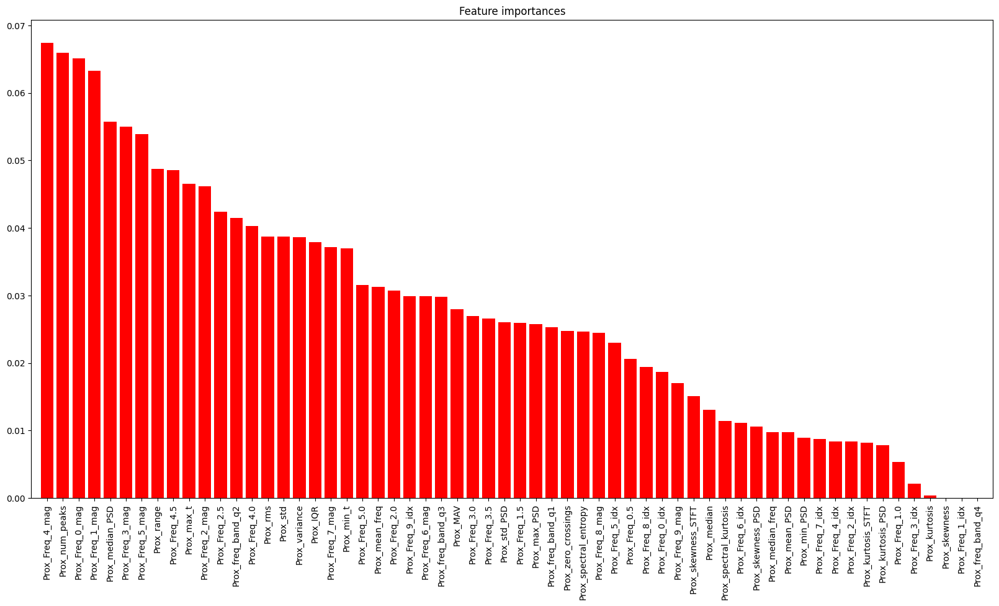

In [415]:
from sklearn.feature_selection import mutual_info_classif

X = np.abs(Prox_features)
y = chewing_labels['chewing_detection']

importances = mutual_info_classif(X,y)
indices = np.argsort(importances)[::-1]
plt.figure(figsize=(20,10))
plt.title("Feature importances")
plt.bar(range(X.shape[1]), importances[indices],
       color="r", align="center")
plt.xticks(range(X.shape[1]), X.columns[indices], rotation=90)
plt.xlim([-1, X.shape[1]])
plt.show()

Logarithmic Transformation of the Prox timeseries

In [407]:
Prox_features_log = pd.DataFrame()
for col in Prox_features.columns:
    Prox_features_log['log_'+col] =(np.log(np.abs(Prox_features[col])))

d:\Downloads\emg_proc\sensor-based-master\.venv\lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning:

divide by zero encountered in log

d:\Downloads\emg_proc\sensor-based-master\.venv\lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning:

divide by zero encountered in log



In [408]:
Prox_features_log = Prox_features_log.replace([np.inf, -np.inf], np.nan).fillna(0)

In [409]:
Prox_features_log.columns

Index(['log_Prox_MAV', 'log_Prox_min_t', 'log_Prox_max_t', 'log_Prox_range',
       'log_Prox_rms', 'log_Prox_median', 'log_Prox_variance', 'log_Prox_std',
       'log_Prox_skewness', 'log_Prox_kurtosis', 'log_Prox_IQR',
       'log_Prox_mean_freq', 'log_Prox_median_freq', 'log_Prox_min_PSD',
       'log_Prox_max_PSD', 'log_Prox_mean_PSD', 'log_Prox_std_PSD',
       'log_Prox_median_PSD', 'log_Prox_skewness_PSD', 'log_Prox_kurtosis_PSD',
       'log_Prox_spectral_kurtosis', 'log_Prox_spectral_entropy',
       'log_Prox_kurtosis_STFT', 'log_Prox_skewness_STFT',
       'log_Prox_freq_band_q1', 'log_Prox_freq_band_q2',
       'log_Prox_freq_band_q3', 'log_Prox_freq_band_q4', 'log_Prox_num_peaks',
       'log_Prox_zero_crossings', 'log_Prox_Freq_0.5', 'log_Prox_Freq_1.0',
       'log_Prox_Freq_1.5', 'log_Prox_Freq_2.0', 'log_Prox_Freq_2.5',
       'log_Prox_Freq_3.0', 'log_Prox_Freq_3.5', 'log_Prox_Freq_4.0',
       'log_Prox_Freq_4.5', 'log_Prox_Freq_5.0', 'log_Prox_Freq_0_idx',
       'l

In [466]:
fig = px.scatter(Prox_features_log, x="log_Prox_mean_freq", y="log_Prox_median_freq", color=chewing_labels['chewing_detection'], marginal_y="violin", marginal_x="box", trendline="ols", template="simple_white")
fig.show()

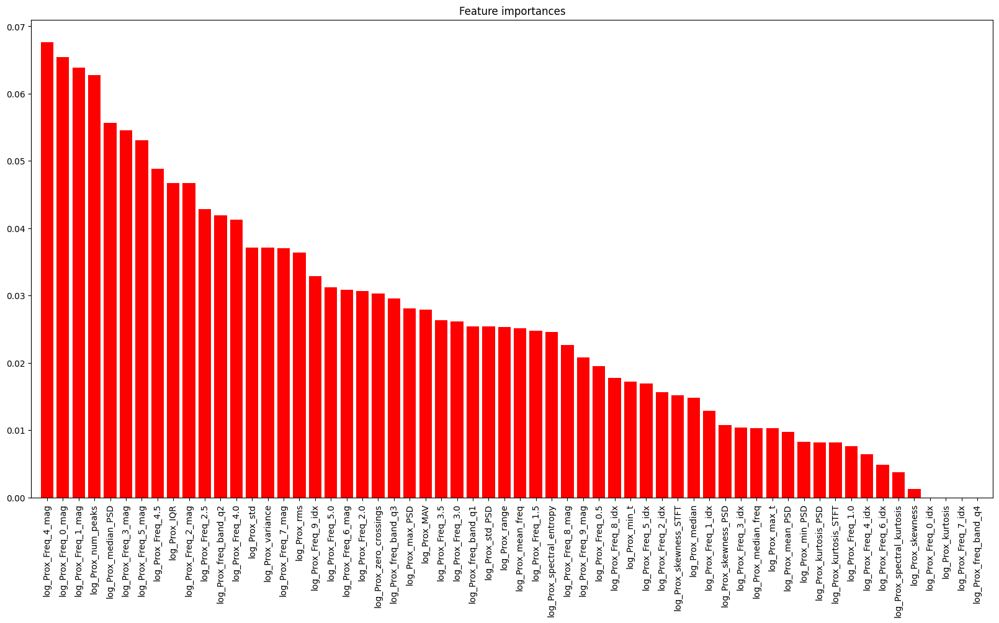

In [411]:
from sklearn.feature_selection import mutual_info_classif

X = np.abs(Prox_features_log)
y = chewing_labels['chewing_detection']

importances = mutual_info_classif(X,y)
indices = np.argsort(importances)[::-1]
plt.figure(figsize=(20,10))
plt.title("Feature importances")
plt.bar(range(X.shape[1]), importances[indices],
       color="r", align="center")
plt.xticks(range(X.shape[1]), X.columns[indices], rotation=90)
plt.xlim([-1, X.shape[1]])
plt.show()

Standardization of the Prox timeseries

In [412]:
Prox_features_std = pd.DataFrame()
for col in Prox_features.columns:
    Prox_features_std['std_'+col] =(Prox_features[col]-Prox_features[col].mean())/Prox_features[col].std()

In [465]:
fig = px.scatter(Prox_features_log, x="log_Prox_variance", y="log_Prox_median_freq", color=chewing_labels['chewing_detection'], marginal_y="violin", marginal_x="box", trendline="ols", template="simple_white")
fig.show()

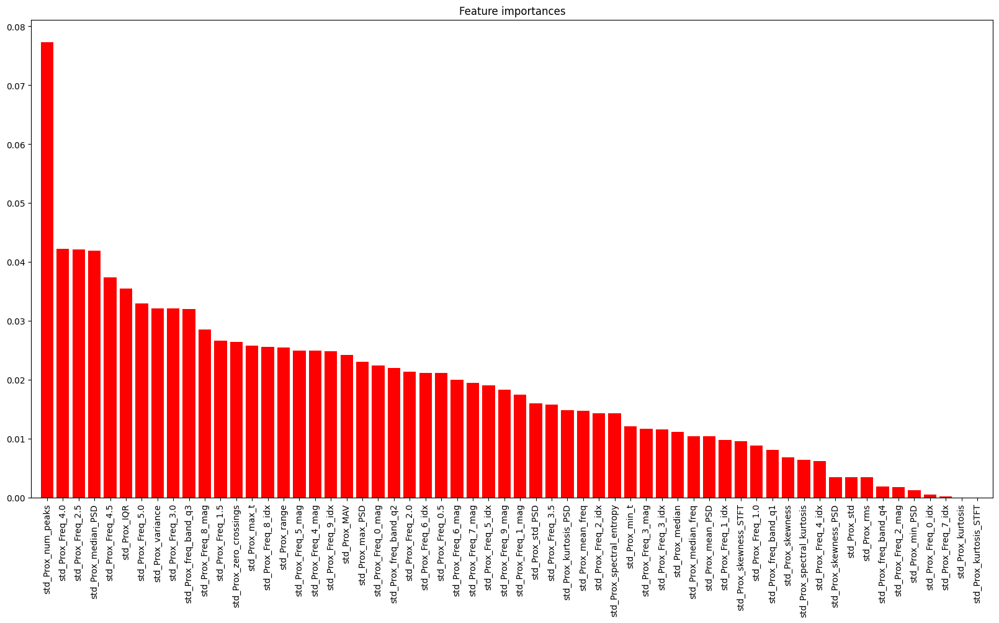

In [414]:
from sklearn.feature_selection import mutual_info_classif

X = np.abs(Prox_features_std)
y = chewing_labels['chewing_detection']

importances = mutual_info_classif(X,y)
indices = np.argsort(importances)[::-1]
plt.figure(figsize=(20,10))
plt.title("Feature importances")
plt.bar(range(X.shape[1]), importances[indices],
       color="r", align="center")
plt.xticks(range(X.shape[1]), X.columns[indices], rotation=90)
plt.xlim([-1, X.shape[1]])
plt.show()

In [416]:
print(chewing_labels[chewing_labels['chewing_detection'] == 0].shape[0])
print(chewing_labels[chewing_labels['chewing_detection'] == 1].shape[0])

1530
1969


In [417]:
chewing_labels.loc[(chewing_labels['chewing_detection'] == 1) & (chewing_labels['chewing_count'] == 0)]

,chewing_detection,chewing_count
14,1,0.0
15,1,0.0
16,1,0.0
17,1,0.0
18,1,0.0
...,...,...
2117,1,0.0
2118,1,0.0
2485,1,0.0
2500,1,0.0


In [176]:
## Split into train, validation, and test sets
# test_size = 0.2
# X_rest, X_test, y_rest, y_test = train_test_split(Prox_features_std, chewing_labels['chewing_detection'], test_size=test_size,random_state = 1)
# valid_size = 0.2
# X_train,X_valid,y_train,y_valid = train_test_split(X_rest,y_rest,test_size = valid_size)

Balanced splitting of the dataset into train and test sets

In [418]:
## Split into train, validation, and test sets
test_size = 0.2
X_rest, X_test, y_rest, y_test = train_test_split(Prox_features_std,chewing_labels['chewing_detection'], test_size=test_size)
# Import the necessary libraries
from imblearn.under_sampling import RandomUnderSampler
# Create a RandomUnderSampler object
rus = RandomUnderSampler(sampling_strategy = 'majority')
# Balancing the data
X_resampled, y_resampled = rus.fit_resample(X_rest, y_rest)
valid_size = 0.2
X_train,X_valid,y_train,y_valid = train_test_split(X_resampled,y_resampled,test_size = valid_size, stratify=y_resampled)
y_train.value_counts()

chewing_detection
1    971
0    971
Name: count, dtype: int64

Random Forest Classifier on the Prox timeseries

In [199]:
from sklearn.ensemble import RandomForestClassifier
clf= RandomForestClassifier(n_estimators=100, max_depth=10,random_state=0)

evaluation = [( X_train, y_train),( X_valid, y_valid)]

clf.fit(X_train, y_train)

pred = clf.predict(X_valid).round()
accuracy = accuracy_score(y_valid, pred)
print ("SCORE:", accuracy)

SCORE: 0.6963562753036437


RBF SVM Classifier on the Prox timeseries

In [193]:
from sklearn.svm import SVC

clf = SVC(kernel='rbf', C=1, gamma = 0.0002,probability = True)

evaluation = [( X_train, y_train),( X_valid, y_valid)]

clf.fit(X_train, y_train)
pred = clf.predict(X_valid).round()
accuracy = accuracy_score(y_valid, pred)
print ("SCORE:", accuracy)

SCORE: 0.6923076923076923


KNN Classifier on the Prox timeseries

In [194]:
from sklearn.neighbors import KNeighborsClassifier
clf = KNeighborsClassifier(n_neighbors=100, weights='distance')
clf.fit(X_train, y_train)
pred = clf.predict(X_valid).round()
accuracy = accuracy_score(y_valid, pred)
print ("SCORE:", accuracy)

SCORE: 0.6842105263157895


In [ ]:
y_pred = clf.predict(X_test)
predictions = [round(value) for value in y_pred]
accuracy = metrics.accuracy_score(y_test, predictions)
precision = metrics.precision_score(y_test, predictions)
recall = metrics.recall_score(y_test, predictions)
f1_score = metrics.f1_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))
print("Precision: %.2f%%" % (precision * 100.0))
print("Recall: %.2f%%" % (recall * 100.0))
print("f1_score: %.2f%%" % (f1_score * 100.0))

XGBoost Classifier on the Prox timeseries

In [124]:
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe
from sklearn.metrics import f1_score

space={'max_depth': hp.quniform("max_depth", 3, 25, 1),
        'gamma': hp.uniform ('gamma', 1,9),
        'reg_alpha' : hp.quniform('reg_alpha', 40,180,1),
        'reg_lambda' : hp.uniform('reg_lambda', 0,1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1),
        'min_child_weight' : hp.quniform('min_child_weight', 1, 10, 1),
        'n_estimators': 180,
        'seed': 0
    }

def objective(space):
    clf=XGBClassifier(objective = 'binary:logistic',
                    n_estimators =space['n_estimators'], max_depth = int(space['max_depth']), gamma = space['gamma'],
                    reg_alpha = int(space['reg_alpha']),min_child_weight=int(space['min_child_weight']),
                    colsample_bytree=int(space['colsample_bytree']),early_stopping_rounds=20,eval_metric = 'error')
    
    evaluation = [( X_train, y_train),( X_valid, y_valid)]
    
    clf.fit(X_train, y_train,
            eval_set=evaluation,verbose=False)
    
    pred = clf.predict(X_valid).round()
    accuracy = accuracy_score(y_valid, pred)
    print ("SCORE:", accuracy)
    return {'loss': -accuracy, 'status': STATUS_OK }
    
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 300,
                        trials = trials)

  0%|          | 0/300 [00:00<?, ?trial/s, best loss=?]

SCORE:                                                 
0.49897750511247446                                    
SCORE:                                                                             
0.49897750511247446                                                                
SCORE:                                                                             
0.6809815950920245                                                                 
SCORE:                                                                             
0.6809815950920245                                                                
SCORE:                                                                            
0.49897750511247446                                                               
SCORE:                                                                            
0.6707566462167689                                                                
SCORE:                                               

In [125]:
best_hyperparams

{'colsample_bytree': 0.8128177988492965,
 'gamma': 2.9801947703891516,
 'max_depth': 14.0,
 'min_child_weight': 2.0,
 'reg_alpha': 40.0,
 'reg_lambda': 0.0693272598478975}

In [126]:
best_hyperparams_hist = {'colsample_bytree': 0.6068195624248094,
 'gamma': 1.0723106792292443,
 'max_depth': 15.0,
 'min_child_weight': 6.0,
 'reg_alpha': 54.0,
 'reg_lambda': 0.5512104764155182}

In [127]:
best_hyperparams['max_depth'] = int(best_hyperparams['max_depth'])

In [128]:
model_hyperopt_prox = XGBClassifier(**best_hyperparams,n_estimators = 180,seed = 0)

In [129]:
model_hyperopt_prox.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8128177988492965, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=2.9801947703891516,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=14, max_leaves=None,
              min_child_weight=2.0, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=180, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [195]:
y_pred = model_hyperopt_prox.predict(X_test)
predictions = [round(value) for value in y_pred]
accuracy = metrics.accuracy_score(y_test, predictions)
precision = metrics.precision_score(y_test, predictions)
recall = metrics.recall_score(y_test, predictions)
f1_score = metrics.f1_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))
print("Precision: %.2f%%" % (precision * 100.0))
print("Recall: %.2f%%" % (recall * 100.0))
print("f1_score: %.2f%%" % (f1_score * 100.0))

Accuracy: 65.00%
Precision: 72.47%
Recall: 63.70%
f1_score: 67.81%


In [196]:
print(metrics.classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.57      0.67      0.62       295
           1       0.72      0.64      0.68       405

    accuracy                           0.65       700
   macro avg       0.65      0.65      0.65       700
weighted avg       0.66      0.65      0.65       700



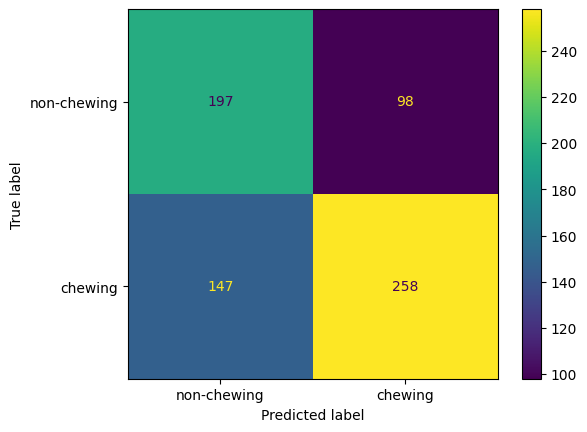

In [197]:
cm = metrics.confusion_matrix(y_test, predictions, labels=[0,1])
disp = metrics.ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=['non-chewing','chewing'])
disp.plot()
plt.show()

### IMU Features

In [419]:
def IMU_feature_extract(sensor_ts_df,sensor):
    feature_set = {'MAV':[],'min_t':[],'max_t':[],'range':[],'rms':[],'median':[],'variance':[],'std':[],'skewness':[],'kurtosis':[],'IQR':[],'mean_freq':[],'median_freq':[],'min_PSD':[],'max_PSD':[],'mean_PSD':[],'std_PSD':[],'median_PSD':[],'skewness_PSD':[],'kurtosis_PSD':[],'spectral_kurtosis':[],'spectral_entropy':[],'kurtosis_STFT':[],'skewness_STFT':[],'freq_band_q1':[],'freq_band_q2':[],'freq_band_q3':[],'freq_band_q4':[],'num_peaks':[],'zero_crossings':[]}
    #label_chewing_detection = []
    #label_chewing_count = []
    window_size = 120
    window_step = 60
    start = 0
    end = len(sensor_ts_df) - 1
    for win_start in range(start,end,window_step):
        win_end = win_start + window_size
        if win_end >= end:
            break
        frame = sensor_ts_df.iloc[win_start:win_end]
        if frame.iloc[-1]['data_pt'] < frame.iloc[0]['data_pt']:
            continue
        if np.any(np.abs(frame['Prox'].diff()) > 4):
            continue
        Prox_demean = pd.Series(filtering(frame[sensor],0.1,5,60))
        feature_set['MAV'].append(Prox_demean.abs().mean())
        feature_set['min_t'].append(Prox_demean.min())
        feature_set['max_t'].append(Prox_demean.max())
        feature_set['range'].append(Prox_demean.max()-Prox_demean.min())
        feature_set['rms'].append(math.sqrt((Prox_demean**2).sum()))
        feature_set['median'].append(Prox_demean.quantile(0.5))
        feature_set['variance'].append((Prox_demean.std())**2)
        feature_set['std'].append(Prox_demean.std())
        feature_set['skewness'].append(Prox_demean.skew())
        feature_set['kurtosis'].append(kurtosis(Prox_demean))
        feature_set['IQR'].append(Prox_demean.quantile(0.75)-Prox_demean.quantile(0.25))
        f, Pxx_dens = signal.periodogram(Prox_demean,fs = 60,window = 'hann')
        feature_set['mean_freq'].append((f*Pxx_dens).sum()/Pxx_dens.sum())
        feature_set['median_freq'].append(Pxx_dens.sum()/2)
        f_stft,t_stft,Zxx = stft(Prox_demean,fs = 60,nperseg = 30,scaling = 'psd')
        feature_set['min_PSD'].append(Pxx_dens.min())
        feature_set['max_PSD'].append(Pxx_dens.max())
        feature_set['mean_PSD'].append(Pxx_dens.mean())
        feature_set['std_PSD'].append(Pxx_dens.std())
        feature_set['median_PSD'].append(np.quantile(Pxx_dens,0.5))
        feature_set['skewness_PSD'].append(skew(Pxx_dens))
        feature_set['kurtosis_PSD'].append(kurtosis(Pxx_dens))
        feature_set['spectral_kurtosis'].append(((np.abs(Zxx)**4).mean(axis = 1) / ((np.abs(Zxx)**2).mean(axis = 1))**2 - 2).mean())
        feature_set['spectral_entropy'].append(antropy.spectral_entropy(Prox_demean, sf=60, method='welch', normalize=True))
        feature_set['kurtosis_STFT'].append(kurtosis(np.abs(Zxx),axis = None))
        feature_set['skewness_STFT'].append(skew(np.abs(Zxx),axis = None))
        for i in np.arange(0.5,5.5,0.5).tolist():
            if f'Freq_{i}' in feature_set.keys():
                feature_set[f'Freq_{i}'].append(Pxx_dens[int(i/0.5)])
            else:
                feature_set[f'Freq_{i}'] = [Pxx_dens[int(i/0.5)]]
        FFT = np.fft.fft(Prox_demean)
        total_energy = get_spec_energy(FFT)
        feature_set['freq_band_q1'].append(find_freq_energy(FFT,0.5,2.5)/total_energy)
        feature_set['freq_band_q2'].append(find_freq_energy(FFT,3.0,5.0)/total_energy)
        feature_set['freq_band_q3'].append(find_freq_energy(FFT,5.5,17.5)/total_energy)
        feature_set['freq_band_q4'].append(find_freq_energy(FFT,18,30.0)/total_energy)
        feature_set['num_peaks'].append(len(find_peaks(Prox_demean,prominence = 0.5)[0]))
        #if frame['label_eating'].mean() > 0.5:
            #label_chewing_detection.append(1)
            #label_chewing_count.append(frame['label_chewing'].sum())
        #else:
            #label_chewing_detection.append(0)
            #label_chewing_count.append(0)
        feature_set['zero_crossings'].append(count_zero_crossings(Prox_demean))
    features = pd.DataFrame.from_dict(feature_set)
    features.columns = [f'{sensor}_{i}' for i in list(feature_set.keys())]
    return features

In [420]:
IMU_1 = pd.DataFrame(np.sqrt((sensor_ts_df_demed[['IMU_1_x', 'IMU_1_y', 'IMU_1_z']]**2).sum(axis = 1)))

In [421]:
IMU_1.columns = ['IMU_1']

In [422]:
IMU_2 = pd.DataFrame(np.sqrt((sensor_ts_df_demed[['IMU_2_x', 'IMU_2_y', 'IMU_2_z']]**2).sum(axis = 1)))
IMU_2.columns = ['IMU_2']

In [423]:
IMU_ts = pd.concat([sensor_ts_df_demed[['data_pt','Prox','label','label_eating','label_chewing']],IMU_1,IMU_2],axis = 1)

In [424]:
IMU_ts

,data_pt,Prox,label,label_eating,label_chewing,IMU_1,IMU_2
0,0.0,0.289474,nan,0,0.0,1.499820,0.565713
1,1.0,0.421053,nan,0,0.0,1.802562,0.631601
2,2.0,0.473684,nan,0,0.0,1.499820,0.761415
3,3.0,0.526316,nan,0,0.0,0.957025,0.788830
4,4.0,0.421053,nan,0,0.0,0.647727,0.897527
...,...,...,...,...,...,...,...
216037,7898.0,-0.278846,nan,0,0.0,1.091709,1.362525
216038,7899.0,-0.307692,nan,0,0.0,1.062128,1.348179
216039,7900.0,-0.336538,nan,0,0.0,0.969854,1.244466
216040,7901.0,-0.355769,nan,0,0.0,0.950935,1.295645


In [425]:
IMU_1_frames = extract_frames(IMU_ts,'IMU_1')

0.0
5.0
3.0


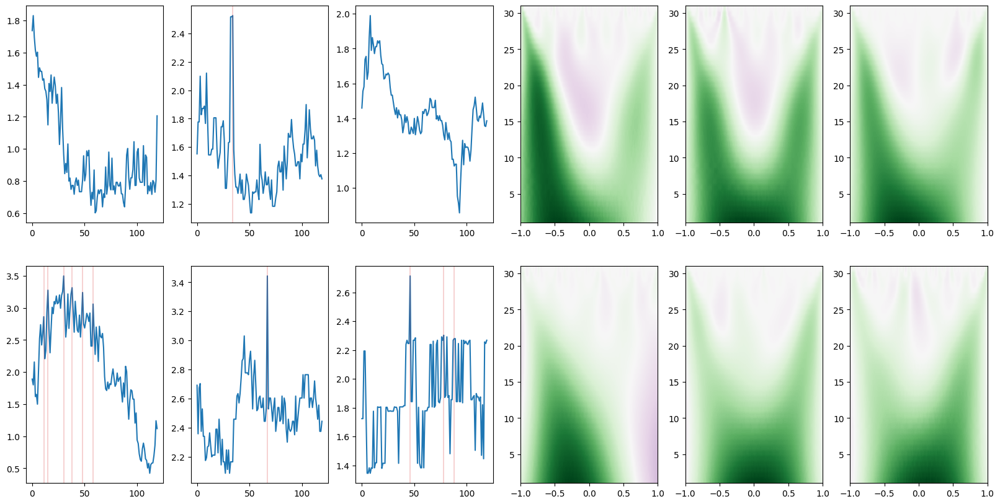

In [426]:
visualize(IMU_1_frames,0.6)

In [427]:
sensor_ts_df_demed.head()

,data_pt,label,label_chewing,label_eating,File,IMU_1_x,IMU_1_y,IMU_1_z,Prox,IMU_2_x,IMU_2_y,IMU_2_z
0,0.0,nan,0.0,0,../original/data_1st\7.21_breakfast\1_sensor_d...,0.529412,-1.333333,0.4375,0.289474,0.000000,-0.35,0.444444
1,1.0,nan,0.0,0,../original/data_1st\7.21_breakfast\1_sensor_d...,0.470588,-1.666667,0.5000,0.421053,-0.166667,-0.25,0.555556
2,2.0,nan,0.0,0,../original/data_1st\7.21_breakfast\1_sensor_d...,0.529412,-1.333333,0.4375,0.473684,-0.333333,-0.40,0.555556
3,3.0,nan,0.0,0,../original/data_1st\7.21_breakfast\1_sensor_d...,0.470588,-0.666667,0.5000,0.526316,-0.333333,-0.45,0.555556
4,4.0,nan,0.0,0,../original/data_1st\7.21_breakfast\1_sensor_d...,0.411765,0.000000,0.5000,0.421053,-0.666667,-0.50,0.333333


In [ ]:
mag_IMU_features_list = []
for i in ['IMU_1', 'IMU_2']:
    mag_IMU_features = IMU_feature_extract(IMU_ts,i)
    mag_IMU_features_list.append(mag_IMU_features)

In [429]:
mag_IMU_features = pd.concat(mag_IMU_features_list,axis = 1)

In [430]:
mag_IMU_features

,IMU_1_MAV,IMU_1_min_t,IMU_1_max_t,IMU_1_range,IMU_1_rms,IMU_1_median,IMU_1_variance,IMU_1_std,IMU_1_skewness,IMU_1_kurtosis,...,IMU_2_Freq_0.5,IMU_2_Freq_1.0,IMU_2_Freq_1.5,IMU_2_Freq_2.0,IMU_2_Freq_2.5,IMU_2_Freq_3.0,IMU_2_Freq_3.5,IMU_2_Freq_4.0,IMU_2_Freq_4.5,IMU_2_Freq_5.0
0,0.229925,-0.395400,1.090598,1.485998,3.480732,-0.066061,0.101757,0.318993,1.528958,2.591909,...,0.000384,0.020332,0.013917,0.002714,0.003906,0.001968,0.001072,0.000290,0.000601,0.000197
1,0.259587,-0.537552,1.014504,1.552056,3.850501,0.021343,0.124516,0.352869,0.858134,0.971274,...,0.033813,0.000123,0.001586,0.000932,0.003474,0.003532,0.001758,0.000663,0.000821,0.000248
2,0.377141,-0.743144,0.949422,1.692566,4.986895,-0.168060,0.206735,0.454681,0.726081,-0.489977,...,0.091669,0.008398,0.000966,0.001256,0.001974,0.001168,0.001329,0.000039,0.000173,0.000908
3,0.351722,-0.728765,0.889866,1.618631,4.535321,-0.009367,0.172005,0.414735,0.391053,-0.848896,...,0.068081,0.024540,0.008371,0.001776,0.002185,0.002033,0.000219,0.003049,0.001989,0.003058
4,0.266929,-0.496365,0.965390,1.461755,3.785793,-0.051355,0.120384,0.346964,1.039402,0.596602,...,0.036496,0.002236,0.000383,0.003768,0.002735,0.004098,0.005945,0.002649,0.001086,0.001684
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3494,0.393217,-0.512965,1.102597,1.615561,5.125454,-0.059116,0.220719,0.469808,0.769138,-0.614883,...,0.116283,0.009860,0.000113,0.000450,0.000002,0.000040,0.000097,0.000180,0.000138,0.000004
3495,0.422188,-0.626093,1.194798,1.820891,5.460320,-0.164672,0.249976,0.499976,0.817037,-0.476400,...,0.109831,0.009671,0.000265,0.000168,0.000053,0.000002,0.000009,0.000059,0.000048,0.000207
3496,0.406175,-0.503497,1.142759,1.646256,5.114128,-0.208837,0.219309,0.468304,0.823811,-0.476948,...,0.129371,0.010755,0.000146,0.000405,0.000013,0.000070,0.000288,0.001273,0.000575,0.000371
3497,0.372017,-0.503298,1.053987,1.557285,4.763071,-0.212566,0.190256,0.436183,0.805139,-0.535231,...,0.148299,0.010658,0.000477,0.000409,0.000399,0.000198,0.000500,0.000364,0.000069,0.000165


In [437]:
import plotly.express as px

fig = px.scatter(mag_IMU_features, x="IMU_1_rms", y="IMU_2_rms", title='IMU_1_x Sensor Data', color=chewing_labels['chewing_detection'].astype(str))
fig.show()

In [431]:
IMU_features_list = []
for i in ["IMU_1_x", "IMU_1_y", "IMU_1_z","IMU_2_x","IMU_2_y","IMU_2_z"]:
    IMU_features = IMU_feature_extract(sensor_ts_df_demed,i)
    IMU_features_list.append(IMU_features)

d:\Downloads\emg_proc\sensor-based-master\.venv\lib\site-packages\scipy\signal\_spectral_py.py:2017: UserWarning:

nperseg = 256 is greater than input length  = 120, using nperseg = 120

d:\Downloads\emg_proc\sensor-based-master\.venv\lib\site-packages\scipy\signal\_spectral_py.py:2017: UserWarning:

nperseg = 256 is greater than input length  = 120, using nperseg = 120

d:\Downloads\emg_proc\sensor-based-master\.venv\lib\site-packages\scipy\signal\_spectral_py.py:2017: UserWarning:

nperseg = 256 is greater than input length  = 120, using nperseg = 120

d:\Downloads\emg_proc\sensor-based-master\.venv\lib\site-packages\scipy\signal\_spectral_py.py:2017: UserWarning:

nperseg = 256 is greater than input length  = 120, using nperseg = 120

d:\Downloads\emg_proc\sensor-based-master\.venv\lib\site-packages\scipy\signal\_spectral_py.py:2017: UserWarning:

nperseg = 256 is greater than input length  = 120, using nperseg = 120

d:\Downloads\emg_proc\sensor-based-master\.venv\lib\site-packages

In [435]:
IMU_features = pd.concat(IMU_features_list,axis = 1)

In [436]:
IMU_features

,IMU_1_x_MAV,IMU_1_x_min_t,IMU_1_x_max_t,IMU_1_x_range,IMU_1_x_rms,IMU_1_x_median,IMU_1_x_variance,IMU_1_x_std,IMU_1_x_skewness,IMU_1_x_kurtosis,...,IMU_2_z_Freq_0.5,IMU_2_z_Freq_1.0,IMU_2_z_Freq_1.5,IMU_2_z_Freq_2.0,IMU_2_z_Freq_2.5,IMU_2_z_Freq_3.0,IMU_2_z_Freq_3.5,IMU_2_z_Freq_4.0,IMU_2_z_Freq_4.5,IMU_2_z_Freq_5.0
0,0.194962,-0.433203,0.442052,0.875256,2.633297,-0.063892,0.050881,0.225568,0.480495,-0.339616,...,0.010810,0.003445,0.011090,0.002247,0.000732,0.001143,1.166008e-03,0.000593,0.000688,0.000434
1,0.132689,-0.436677,0.287271,0.723949,1.877917,-0.007990,0.029552,0.171906,-0.309359,-0.189290,...,0.012788,0.014914,0.007888,0.001670,0.001370,0.002355,1.603675e-03,0.000617,0.000716,0.001353
2,0.246607,-0.612549,0.427803,1.040352,3.087262,0.144598,0.075120,0.274081,-0.836764,-0.313173,...,0.014760,0.003381,0.002274,0.000376,0.002373,0.000410,8.199648e-05,0.000184,0.000552,0.000761
3,0.094946,-0.434735,0.213553,0.648289,1.542229,0.033861,0.019983,0.141360,-1.598893,2.104026,...,0.009593,0.011926,0.008969,0.000793,0.001275,0.003290,3.338765e-03,0.003287,0.000963,0.000742
4,0.087717,-0.227535,0.162352,0.389888,1.142767,-0.029995,0.010362,0.101796,0.062304,-0.880670,...,0.005092,0.003111,0.001207,0.000262,0.000774,0.000386,3.318393e-04,0.000409,0.000002,0.000066
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3494,0.247529,-0.752967,0.293683,1.046650,3.210885,0.099858,0.086580,0.294244,-0.915267,-0.236365,...,0.033955,0.004220,0.000302,0.000792,0.000038,0.000005,8.326883e-06,0.000031,0.000009,0.000017
3495,0.245220,-0.750747,0.279621,1.030368,3.197198,0.107736,0.085880,0.293053,-0.975656,-0.183580,...,0.025676,0.003236,0.000231,0.000347,0.000020,0.000070,9.729700e-07,0.000119,0.000023,0.000005
3496,0.253540,-0.744852,0.307552,1.052404,3.265126,0.106893,0.089526,0.299210,-0.869281,-0.378406,...,0.045046,0.005919,0.000201,0.000246,0.000255,0.000064,1.950294e-05,0.000266,0.000041,0.000021
3497,0.258311,-0.771516,0.313661,1.085177,3.323733,0.116710,0.092674,0.304424,-0.901240,-0.277542,...,0.055585,0.003986,0.000730,0.000708,0.000409,0.000050,3.433897e-05,0.000047,0.000154,0.000096


In [439]:
fig = px.scatter(IMU_features, x="IMU_1_x_MAV", y="IMU_2_x_MAV", title='IMU_1_x Sensor Data', color=chewing_labels['chewing_detection'].astype(str))
fig.show()

Log Transformation of the IMU magnitude timeseries

In [440]:
mag_IMU_features_log = pd.DataFrame()
for col in mag_IMU_features.columns:
    mag_IMU_features_log['log_'+col] =(np.log(np.abs(mag_IMU_features[col])))

d:\Downloads\emg_proc\sensor-based-master\.venv\lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning:

divide by zero encountered in log

d:\Downloads\emg_proc\sensor-based-master\.venv\lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning:

divide by zero encountered in log

d:\Downloads\emg_proc\sensor-based-master\.venv\lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning:

divide by zero encountered in log



In [441]:
mag_IMU_features_log


,log_IMU_1_MAV,log_IMU_1_min_t,log_IMU_1_max_t,log_IMU_1_range,log_IMU_1_rms,log_IMU_1_median,log_IMU_1_variance,log_IMU_1_std,log_IMU_1_skewness,log_IMU_1_kurtosis,...,log_IMU_2_Freq_0.5,log_IMU_2_Freq_1.0,log_IMU_2_Freq_1.5,log_IMU_2_Freq_2.0,log_IMU_2_Freq_2.5,log_IMU_2_Freq_3.0,log_IMU_2_Freq_3.5,log_IMU_2_Freq_4.0,log_IMU_2_Freq_4.5,log_IMU_2_Freq_5.0
0,-1.470001,-0.927858,0.086727,0.396087,1.247243,-2.717184,-2.285170,-1.142585,0.424586,0.952394,...,-7.864313,-3.895555,-4.274653,-5.909377,-5.545190,-6.230620,-6.838171,-8.144679,-7.417200,-8.530387
1,-1.348665,-0.620730,0.014400,0.439580,1.348203,-3.847031,-2.083319,-1.041659,-0.152995,-0.029147,...,-3.386897,-8.999594,-6.446677,-6.977742,-5.662516,-5.645892,-6.343490,-7.319404,-7.104814,-8.303001
2,-0.975137,-0.296865,-0.051902,0.526246,1.606814,-1.783434,-1.576316,-0.788158,-0.320093,-0.713398,...,-2.389573,-4.779742,-6.942055,-6.679875,-6.227653,-6.752741,-6.623237,-10.142071,-8.660584,-7.004712
3,-1.044914,-0.316404,-0.116684,0.481581,1.511896,-4.670544,-1.760233,-0.880116,-0.938912,-0.163818,...,-2.687052,-3.707437,-4.782985,-6.333295,-6.126100,-6.198100,-8.428150,-5.792977,-6.220209,-5.790006
4,-1.320773,-0.700444,-0.035224,0.379637,1.331255,-2.968991,-2.117067,-1.058534,0.038646,-0.516505,...,-3.310563,-6.103072,-7.868454,-5.581130,-5.901496,-5.497374,-5.125200,-5.933752,-6.825420,-6.386815
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3494,-0.933393,-0.667548,0.097668,0.479682,1.634219,-2.828253,-1.510863,-0.755431,-0.262485,-0.486323,...,-2.151724,-4.619316,-9.084705,-7.705373,-12.944900,-10.121897,-9.237142,-8.621515,-8.888880,-12.547994
3495,-0.862305,-0.468256,0.177977,0.599326,1.697507,-1.803798,-1.386391,-0.693196,-0.202071,-0.741498,...,-2.208808,-4.638666,-8.234544,-8.693503,-9.852662,-13.101393,-11.601127,-9.745390,-9.943683,-8.482189
3496,-0.900970,-0.686178,0.133445,0.498503,1.632007,-1.566202,-1.517273,-0.758637,-0.193814,-0.740349,...,-2.045071,-4.532338,-8.834715,-7.810832,-11.230969,-9.567651,-8.153980,-6.666621,-7.461405,-7.899194
3497,-0.988817,-0.686572,0.052580,0.442944,1.560893,-1.548504,-1.659385,-0.829693,-0.216740,-0.625057,...,-1.908526,-4.541489,-7.647030,-7.801303,-7.827345,-8.529096,-7.601042,-7.918085,-9.578623,-8.712197


In [442]:
fig = px.scatter(mag_IMU_features_log, x="log_IMU_1_MAV", y="log_IMU_2_MAV", title='IMU_1_x Sensor Data', color=chewing_labels['chewing_detection'].astype(str))
fig.show()

###  Proximity & IMU magnitude

In [443]:
features = pd.concat([Prox_features,mag_IMU_features],axis = 1)

In [444]:
# log transform
# all_features_list = []
# for col in features.columns:
#     all_features_list.append(np.log(np.abs(features[col]+1)))

# all_features_log = pd.concat(all_features_list,axis = 1)

d:\Downloads\emg_proc\sensor-based-master\.venv\lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning:

divide by zero encountered in log



In [447]:
features

,Prox_MAV,Prox_min_t,Prox_max_t,Prox_range,Prox_rms,Prox_median,Prox_variance,Prox_std,Prox_skewness,Prox_kurtosis,...,IMU_2_Freq_0.5,IMU_2_Freq_1.0,IMU_2_Freq_1.5,IMU_2_Freq_2.0,IMU_2_Freq_2.5,IMU_2_Freq_3.0,IMU_2_Freq_3.5,IMU_2_Freq_4.0,IMU_2_Freq_4.5,IMU_2_Freq_5.0
0,0.776901,-1.212719,2.050439,3.263158,10.205003,0.103070,0.875144,0.935491,0.394088,-0.724335,...,0.000384,0.020332,0.013917,0.002714,0.003906,0.001968,0.001072,0.000290,0.000601,0.000197
1,0.598743,-0.712281,1.892982,2.605263,7.671108,-0.370175,0.494503,0.703209,0.976104,-0.384626,...,0.033813,0.000123,0.001586,0.000932,0.003474,0.003532,0.001758,0.000663,0.000821,0.000248
2,0.538012,-0.773246,1.910965,2.684211,7.101576,-0.352193,0.423802,0.651000,1.210566,0.271343,...,0.091669,0.008398,0.000966,0.001256,0.001974,0.001168,0.001329,0.000039,0.000173,0.000908
3,0.265607,-0.562719,1.226754,1.789474,3.878019,-0.141667,0.126378,0.355497,1.573681,1.782759,...,0.068081,0.024540,0.008371,0.001776,0.002185,0.002033,0.000219,0.003049,0.001989,0.003058
4,0.453085,-0.700439,2.852193,3.552632,7.976609,-0.226754,0.534675,0.731215,2.639790,6.316719,...,0.036496,0.002236,0.000383,0.003768,0.002735,0.004098,0.005945,0.002649,0.001086,0.001684
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3494,0.082898,-0.155609,0.296314,0.451923,1.132983,-0.020994,0.010787,0.103860,0.738541,-0.101427,...,0.116283,0.009860,0.000113,0.000450,0.000002,0.000040,0.000097,0.000180,0.000138,0.000004
3495,0.085028,-0.131651,0.416426,0.548077,1.123955,-0.006651,0.010616,0.103033,0.782570,0.713818,...,0.109831,0.009671,0.000265,0.000168,0.000053,0.000002,0.000009,0.000059,0.000048,0.000207
3496,0.322855,-0.395593,1.075561,1.471154,4.545368,-0.155208,0.173617,0.416673,1.366326,0.785250,...,0.129371,0.010755,0.000146,0.000405,0.000013,0.000070,0.000288,0.001273,0.000575,0.000371
3497,0.216955,-0.450641,0.876282,1.326923,3.464927,-0.056410,0.100888,0.317629,1.426467,1.655279,...,0.148299,0.010658,0.000477,0.000409,0.000399,0.000198,0.000500,0.000364,0.000069,0.000165


In [448]:
import plotly.express as px

fig = px.scatter(features, x="IMU_1_Freq_2.5", y="IMU_2_Freq_2.5", title='IMU_1_x Sensor Data', color=chewing_labels['chewing_detection'].astype(str))
fig.show()

In [235]:
## Split into train, validation, and test sets
test_size = 0.2
X_rest, X_test, y_rest, y_test = train_test_split(features, chewing_labels['chewing_detection'], test_size=test_size,random_state = 1)
valid_size = 0.2
X_train,X_valid,y_train,y_valid = train_test_split(X_rest,y_rest,test_size = valid_size)

In [ ]:
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe
from sklearn.metrics import f1_score

space={'max_depth': hp.quniform("max_depth", 3, 25, 1),
        'gamma': hp.uniform ('gamma', 1,9),
        'reg_alpha' : hp.quniform('reg_alpha', 40,180,1),
        'reg_lambda' : hp.uniform('reg_lambda', 0,1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1),
        'min_child_weight' : hp.quniform('min_child_weight', 1, 10, 1),
        'n_estimators': 180,
        'seed': 0
    }

def objective(space):
    clf=XGBClassifier(objective = 'binary:logistic',
                    n_estimators =space['n_estimators'], max_depth = int(space['max_depth']), gamma = space['gamma'],
                    reg_alpha = int(space['reg_alpha']),min_child_weight=int(space['min_child_weight']),
                    colsample_bytree=int(space['colsample_bytree']),early_stopping_rounds=20,eval_metric = 'error')
    
    evaluation = [( X_train, y_train),( X_valid, y_valid)]
    
    clf.fit(X_train, y_train,
            eval_set=evaluation,verbose=False)
    
    pred = clf.predict(X_valid).round()
    accuracy = accuracy_score(y_valid, pred)
    print ("SCORE:", accuracy)
    return {'loss': -accuracy, 'status': STATUS_OK }
    
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 300,
                        trials = trials)

In [264]:
best_hyperparams

{'colsample_bytree': 0.7019752292601426,
 'gamma': 1.6507881347709887,
 'max_depth': 9.0,
 'min_child_weight': 1.0,
 'reg_alpha': 43.0,
 'reg_lambda': 0.34611036861735056}

In [265]:
best_hyperparams['max_depth'] = int(best_hyperparams['max_depth'])

In [266]:
model_hyperopt_Prox_imu = XGBClassifier(**best_hyperparams,n_estimators = 180,seed = 0)

In [267]:
model_hyperopt_Prox_imu.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.7019752292601426, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=1.6507881347709887,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=9, max_leaves=None,
              min_child_weight=1.0, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=180, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [268]:
y_pred = model_hyperopt_Prox_imu.predict(X_test)
predictions = [round(value) for value in y_pred]
accuracy = metrics.accuracy_score(y_test, predictions)
precision = metrics.precision_score(y_test, predictions)
recall = metrics.recall_score(y_test, predictions)
f1_score = metrics.f1_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))
print("Precision: %.2f%%" % (precision * 100.0))
print("Recall: %.2f%%" % (recall * 100.0))
print("f1_score: %.2f%%" % (f1_score * 100.0))

Accuracy: 59.56%
Precision: 57.60%
Recall: 50.73%
f1_score: 53.95%


In [269]:
print(metrics.classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.61      0.67      0.64      1884
           1       0.58      0.51      0.54      1650

    accuracy                           0.60      3534
   macro avg       0.59      0.59      0.59      3534
weighted avg       0.59      0.60      0.59      3534



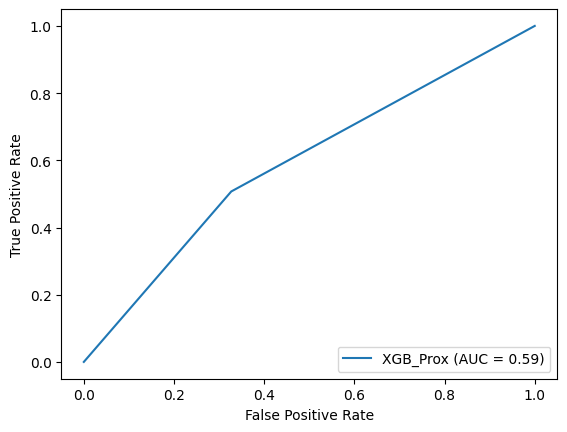

In [270]:
fpr, tpr, thresholds = metrics.roc_curve(y_test, predictions)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc,estimator_name='XGB_Prox')
display.plot()
plt.show()

### Training with all features

In [449]:
all_features = pd.concat([Prox_features,IMU_features],axis = 1)

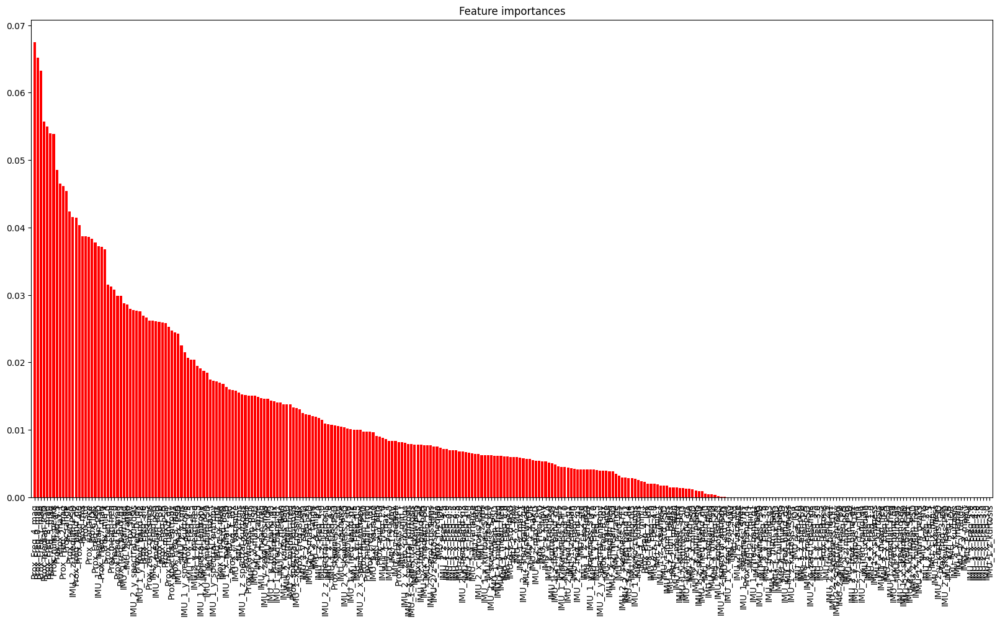

In [450]:
X = all_features
importances = mutual_info_classif(X,chewing_labels['chewing_detection'])
indices = np.argsort(importances)[::-1]
plt.figure(figsize=(20,10))
plt.title("Feature importances")
plt.bar(range(X.shape[1]), importances[indices],
       color="r", align="center")
plt.xticks(range(X.shape[1]), X.columns[indices], rotation=90)
plt.xlim([-1, X.shape[1]])
plt.show()


In [451]:
#select only the top 50 features
top_features = X.columns[indices[:50]]
top_features

Index(['Prox_Freq_4_mag', 'Prox_Freq_0_mag', 'Prox_Freq_1_mag',
       'Prox_median_PSD', 'Prox_Freq_3_mag', 'Prox_Freq_5_mag',
       'Prox_num_peaks', 'Prox_Freq_4.5', 'Prox_max_t', 'Prox_Freq_2_mag',
       'Prox_range', 'Prox_Freq_2.5', 'IMU_2_z_median_PSD',
       'Prox_freq_band_q2', 'Prox_Freq_4.0', 'Prox_rms', 'Prox_std',
       'Prox_variance', 'Prox_IQR', 'Prox_Freq_9_idx', 'IMU_1_y_median_PSD',
       'Prox_Freq_7_mag', 'Prox_min_t', 'Prox_Freq_5.0', 'Prox_mean_freq',
       'Prox_Freq_2.0', 'Prox_Freq_6_mag', 'Prox_freq_band_q3',
       'IMU_2_z_mean_freq', 'IMU_2_y_range', 'Prox_MAV',
       'IMU_2_y_spectral_kurtosis', 'Prox_Freq_0_idx', 'IMU_1_y_freq_band_q2',
       'Prox_Freq_3.0', 'Prox_Freq_3.5', 'Prox_zero_crossings',
       'IMU_2_z_Freq_2.5', 'IMU_2_y_median_PSD', 'Prox_std_PSD',
       'Prox_Freq_1.5', 'Prox_max_PSD', 'Prox_freq_band_q1',
       'Prox_spectral_entropy', 'Prox_Freq_8_mag', 'IMU_2_y_max_PSD',
       'IMU_2_y_rms', 'IMU_1_y_spectral_kurtosis', 'Prox

In [454]:
fig = px.scatter(X, x="Prox_Freq_4_mag",y="Prox_Freq_0_mag", title='Sensor Data', color=chewing_labels['chewing_detection'].astype(str))
fig.show()

In [455]:
all_features[top_features].shape

(3499, 50)

In [293]:
## Split into train, validation, and test sets
# test_size = 0.2
# X_rest, X_test, y_rest, y_test = train_test_split(all_features[top_features], chewing_labels['chewing_detection'], test_size=test_size,random_state = 1)
# valid_size = 0.2
# X_train,X_valid,y_train,y_valid = train_test_split(X_rest,y_rest,test_size = valid_size)

Balanced splitting of the dataset into train and test sets

In [456]:
## Split into train, validation, and test sets
test_size = 0.2
X_rest, X_test, y_rest, y_test = train_test_split(all_features[top_features],chewing_labels['chewing_detection'], test_size=test_size)
# Import the necessary libraries
from imblearn.under_sampling import RandomUnderSampler
# Create a RandomUnderSampler object
rus = RandomUnderSampler(sampling_strategy = 'majority')
# Balancing the data
X_resampled, y_resampled = rus.fit_resample(X_rest, y_rest)
valid_size = 0.2
X_train,X_valid,y_train,y_valid = train_test_split(X_resampled,y_resampled,test_size = valid_size, stratify=y_resampled)
y_train.value_counts()

chewing_detection
0    979
1    979
Name: count, dtype: int64

Random Forest Classifier on top 50 features

In [457]:
from sklearn.ensemble import RandomForestClassifier
clf= RandomForestClassifier(n_estimators=280, max_depth=3, n_jobs=-1)

evaluation = [( X_train, y_train),( X_valid, y_valid)]

clf.fit(X_train, y_train)

pred = clf.predict(X_valid).round()
accuracy = accuracy_score(y_valid, pred)
print ("SCORE:", accuracy)

SCORE: 0.6571428571428571


SVM Classifier on top 50 features

In [361]:
from sklearn.svm import SVC

clf = SVC(kernel='rbf', C=1, gamma = 0.0002,probability = True)

evaluation = [( X_train, y_train),( X_valid, y_valid)]

clf.fit(X_train, y_train)
pred = clf.predict(X_valid).round()
accuracy = accuracy_score(y_valid, pred)
print ("SCORE:", accuracy)

SCORE: 0.6275720164609053


KNN Classifier on top 50 features

In [458]:
from sklearn.neighbors import KNeighborsClassifier
clf = KNeighborsClassifier(n_neighbors=19, weights='distance', n_jobs=-1)
clf.fit(X_train, y_train)
pred = clf.predict(X_valid).round()
accuracy = accuracy_score(y_valid, pred)
print ("SCORE:", accuracy)

SCORE: 0.6510204081632653


In [459]:
y_pred = clf.predict(X_test)
predictions = [round(value) for value in y_pred]
accuracy = metrics.accuracy_score(y_test, predictions)
precision = metrics.precision_score(y_test, predictions)
recall = metrics.recall_score(y_test, predictions)
f1_score = metrics.f1_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))
print("Precision: %.2f%%" % (precision * 100.0))
print("Recall: %.2f%%" % (recall * 100.0))
print("f1_score: %.2f%%" % (f1_score * 100.0))

Accuracy: 60.71%
Precision: 66.95%
Recall: 59.64%
f1_score: 63.09%


XGBoost Classifier on top 50 features

In [367]:
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe
from sklearn.metrics import f1_score

space={'max_depth': hp.quniform("max_depth", 3, 25, 1),
        'gamma': hp.uniform ('gamma', 1,9),
        'reg_alpha' : hp.quniform('reg_alpha', 40,180,1),
        'reg_lambda' : hp.uniform('reg_lambda', 0,1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1),
        'min_child_weight' : hp.quniform('min_child_weight', 1, 10, 1),
        'n_estimators': 180,
        'seed': 0
    }

def objective(space):
    clf=XGBClassifier(objective = 'binary:logistic',
                    n_estimators =space['n_estimators'], max_depth = int(space['max_depth']), gamma = space['gamma'],
                    reg_alpha = int(space['reg_alpha']),min_child_weight=int(space['min_child_weight']),
                    colsample_bytree=int(space['colsample_bytree']),early_stopping_rounds=20,eval_metric = 'error', n_jobs=-1)
    
    evaluation = [( X_train, y_train),( X_valid, y_valid)]
    
    clf.fit(X_train, y_train,
            eval_set=evaluation,verbose=False)
    
    pred = clf.predict(X_valid).round()
    accuracy = accuracy_score(y_valid, pred)
    print ("SCORE:", accuracy)
    return {'loss': -accuracy, 'status': STATUS_OK }
    
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 300,
                        trials = trials)

SCORE:                                                 
0.6316872427983539                                     
SCORE:                                                                            
0.6440329218106996                                                                
SCORE:                                                                            
0.6316872427983539                                                                
SCORE:                                                                            
0.6502057613168725                                                                
SCORE:                                                                            
0.6378600823045267                                                                
SCORE:                                                                            
0.5                                                                               
SCORE:                                                    

In [301]:
best_hyperparams

{'colsample_bytree': 0.8077215005185601,
 'gamma': 3.2098365385039114,
 'max_depth': 23.0,
 'min_child_weight': 6.0,
 'reg_alpha': 41.0,
 'reg_lambda': 0.5920566238431434}

In [302]:
best_hyperparams['max_depth'] = int(best_hyperparams['max_depth'])

In [303]:
model_hyperopt_all = XGBClassifier(**best_hyperparams,n_estimators = 180,seed = 0)

In [368]:
model_hyperopt_all.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8077215005185601, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=3.2098365385039114,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=23, max_leaves=None,
              min_child_weight=6.0, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=180, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [369]:
y_pred = model_hyperopt_all.predict(X_test)
predictions = [round(value) for value in y_pred]
accuracy = metrics.accuracy_score(y_test, predictions)
precision = metrics.precision_score(y_test, predictions)
recall = metrics.recall_score(y_test, predictions)
f1_score = metrics.f1_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))
print("Precision: %.2f%%" % (precision * 100.0))
print("Recall: %.2f%%" % (recall * 100.0))
print("f1_score: %.2f%%" % (f1_score * 100.0))

Accuracy: 65.00%
Precision: 66.75%
Recall: 71.80%
f1_score: 69.18%


In [370]:
print(metrics.classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.62      0.57      0.60       317
           1       0.67      0.72      0.69       383

    accuracy                           0.65       700
   macro avg       0.65      0.64      0.64       700
weighted avg       0.65      0.65      0.65       700



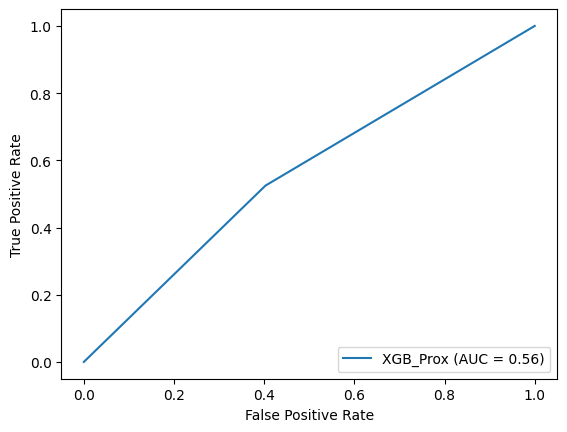

In [46]:
fpr, tpr, thresholds = metrics.roc_curve(y_test, predictions)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc,estimator_name='XGB_Prox')
display.plot()
plt.show()

Neural Network on top 50 features

In [463]:
## Split into train, validation, and test sets
test_size = 0.2
X_rest, X_test, y_rest, y_test = train_test_split(all_features[top_features],chewing_labels['chewing_detection'], test_size=test_size)
# Import the necessary libraries
from imblearn.under_sampling import RandomUnderSampler
# Create a RandomUnderSampler object
rus = RandomUnderSampler(sampling_strategy = 'majority')
# Balancing the data
X_resampled, y_resampled = rus.fit_resample(X_rest, y_rest)
valid_size = 0.2
X_train,X_valid,y_train,y_valid = train_test_split(X_resampled,y_resampled,test_size = valid_size, stratify=y_resampled)
y_train.value_counts()

chewing_detection
1    970
0    970
Name: count, dtype: int64

In [464]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM, Activation, Bidirectional
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras import regularizers
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import PReLU
from tensorflow.keras.layers import ELU
from tensorflow.keras.layers import ThresholdedReLU
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Conv1D
from tensorflow.keras.layers import MaxPooling1D

def create_model():
    model = Sequential()
    model.add(Dense(100, input_dim=all_features[top_features].shape[1], activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(50, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

model = create_model()
model.summary()


Model: "sequential_33"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_103 (Dense)           (None, 100)               5100      
                                                                 
 dropout_25 (Dropout)        (None, 100)               0         
                                                                 
 dense_104 (Dense)           (None, 50)                5050      
                                                                 
 dense_105 (Dense)           (None, 1)                 51        
                                                                 
Total params: 10201 (39.85 KB)
Trainable params: 10201 (39.85 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [391]:

from sklearn.model_selection import StratifiedKFold

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)
cvscores = []
for train, test in kfold.split(all_features[top_features], chewing_labels['chewing_detection']):
    # create model
    model = create_model()
    # Fit the model
    model.fit(all_features[top_features].iloc[train], chewing_labels['chewing_detection'].iloc[train], epochs=100, batch_size=32, verbose=0)
    # evaluate the model
    scores = model.evaluate(all_features[top_features].iloc[test], chewing_labels['chewing_detection'].iloc[test], verbose=0)
    print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

accuracy: 64.86%
accuracy: 68.29%
accuracy: 61.71%
accuracy: 62.29%
accuracy: 62.57%
accuracy: 67.71%
accuracy: 66.00%
accuracy: 64.00%
accuracy: 64.57%
accuracy: 65.62%
64.76% (+/- 2.10%)
